In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov2_allmodels.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 102 entries, PatientID to Married
dtypes: bool(10), float64(77), int64(11), object(4)
memory usage: 11.4+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v2_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=True, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1172 entries, 4740 to 10150
Data columns (total 96 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              1172 non-null   int64  
 1   StudyDate              1172 non-null   int64  
 2   SeriesInstanceUID      1172 non-null   object 
 3   LesionID               1172 non-null   int64  
 4   Spiculation            1172 non-null   bool   
 5   Diameter [mm]          1172 non-null   float64
 6   Age                    1172 non-null   int64  
 7   Gender                 1172 non-null   int64  
 8   FamilyHistoryLungCa    1172 non-null   bool   
 9   Emphysema              1172 non-null   bool   
 10  NoduleInUpperLung      1172 non-null   bool   
 11  NoduleCounts           1172 non-null   int64  
 12  SCT_EPI_LOC            1119 non-null   float64
 13  xie_gc_gclobe150       53 non-null     float64
 14  loclup                 127 non-null    float64
 15  locru

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)


In [22]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (shown nodule)": "Thijmen_global_show",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

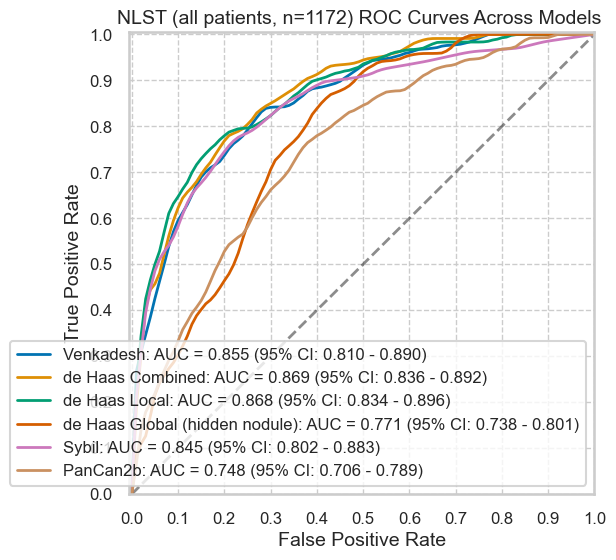

In [23]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [24]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("More than binary: not computing significance test results.")

    # for m in perfs:
    #     print(m)
    #     display(perfs[m])

## Split Data by a Category

#### Gender

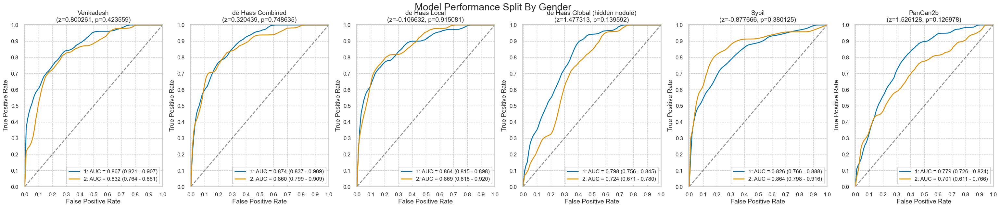

,num,pct,num_mal,pct_mal
1,693,59.129693,79,11.399711
2,479,40.870307,48,10.020877


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.800261,0.320439,-0.106632,1.477313,-0.877666,1.526128
p,0.423559,0.748635,0.915081,0.139592,0.380125,0.126978


In [34]:
SPLIT_CAT = 'Gender'
split_groups = nlst_preds.groupby(SPLIT_CAT)
plot_by_category(nlst_preds, SPLIT_CAT)

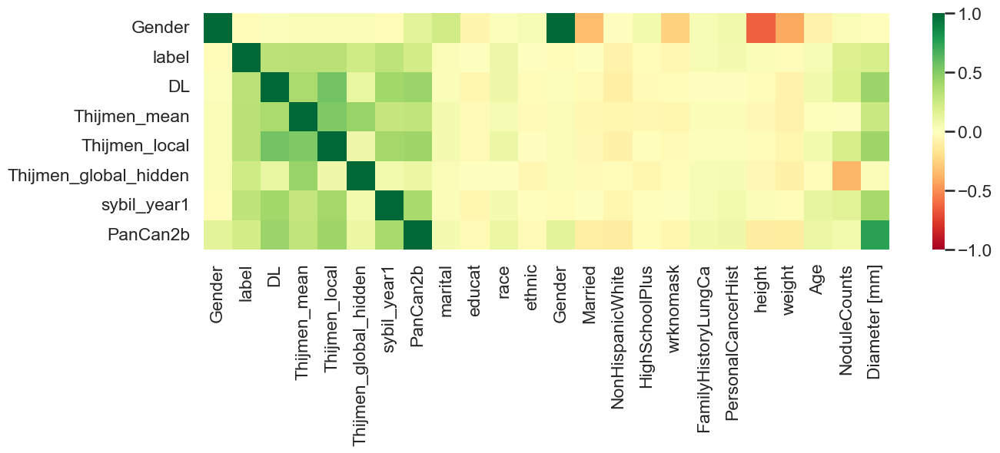

In [45]:
cols_list = list(set([SPLIT_CAT, 'label'] + list(MODEL_TO_COL.values()) + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]']))
correlations = nlst_preds[cols_list].corr(method='kendall').round(4)

corr_rows = [SPLIT_CAT, 'label'] + list(MODEL_TO_COL.values())
corr_cols = corr_rows + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]']
plt.figure(figsize=(len(corr_cols) * 0.6, len(corr_rows) * 0.5))
sns.heatmap(correlations.loc[corr_rows, corr_cols], cmap='RdYlGn', vmin=-1, vmax=1)
plt.show()

## Plot intersectional results by category

In [37]:
def plot_intersectional(df, cat, split_cat=SPLIT_CAT, split_groups=split_groups):
    for splitval, splitdf in split_groups:
        display(Markdown(f"#### {cat}: {split_cat} = {splitval}"))
        catinfo, perfs, sigtestresults = utils.roc_cm_by_category(splitdf, cat, MODEL_TO_COL)
        display(catinfo)
        
        if sigtestresults is not None:
            print("Hanley-McNeil significance test results:")
            display(sigtestresults)
        else:
            print("More than binary: not computing significance test results.")

        # for m in perfs:
        #     print(m)
        #     display(perfs[m])

### Included columns (from predictions)

#### wrknomask: Gender = 1

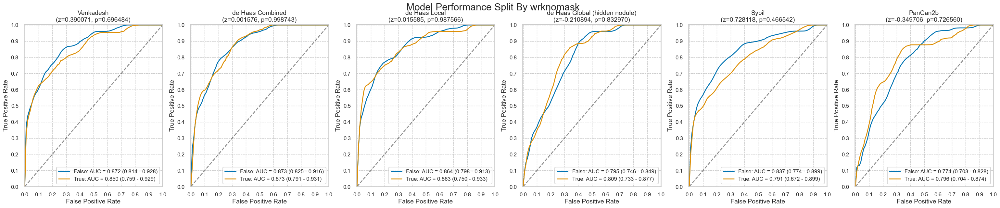

,num,pct,num_mal,pct_mal
False,452,65.223665,54,11.946903
True,241,34.776335,25,10.373444


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.390071,0.001576,0.015585,-0.210894,0.728118,-0.349706
p,0.696484,0.998743,0.987566,0.832970,0.466542,0.726560


#### wrknomask: Gender = 2

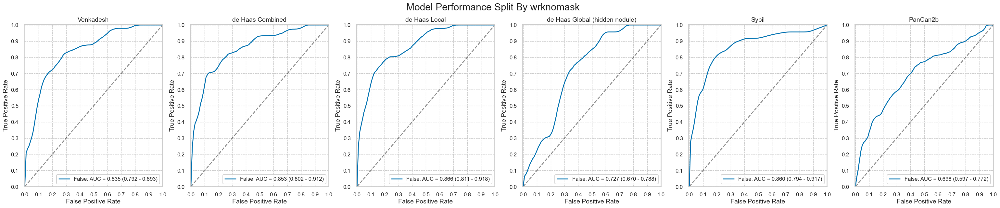

,num,pct,num_mal,pct_mal
False,420,87.682672,48,11.428571
True,59,12.317328,0,0.000000


More than binary: not computing significance test results.


#### FamilyHistoryLungCa: Gender = 1

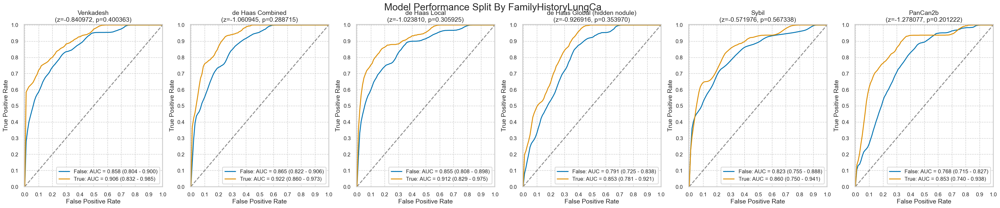

,num,pct,num_mal,pct_mal
False,525,75.757576,62,11.809524
True,168,24.242424,17,10.119048


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.840972,-1.060945,-1.023810,-0.926916,-0.571976,-1.278077
p,0.400363,0.288715,0.305925,0.353970,0.567338,0.201222


#### FamilyHistoryLungCa: Gender = 2

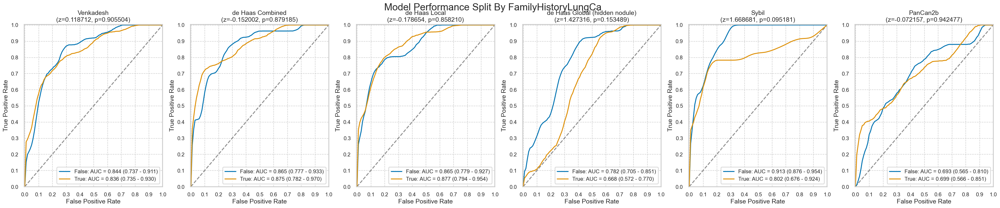

,num,pct,num_mal,pct_mal
False,345,72.025052,25,7.246377
True,134,27.974948,23,17.164179


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.118712,-0.152002,-0.178654,1.427316,1.668681,-0.072157
p,0.905504,0.879185,0.858210,0.153489,0.095181,0.942477


#### PersonalCancerHist: Gender = 1

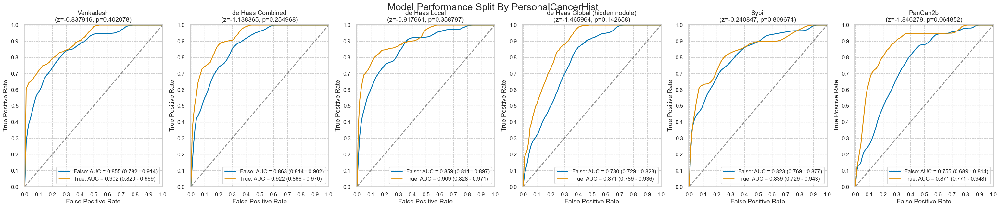

,num,pct,num_mal,pct_mal
False,506,73.015873,60,11.857708
True,187,26.984127,19,10.160428


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.837916,-1.138365,-0.917661,-1.465964,-0.240847,-1.846279
p,0.402078,0.254968,0.358797,0.142658,0.809674,0.064852


#### PersonalCancerHist: Gender = 2

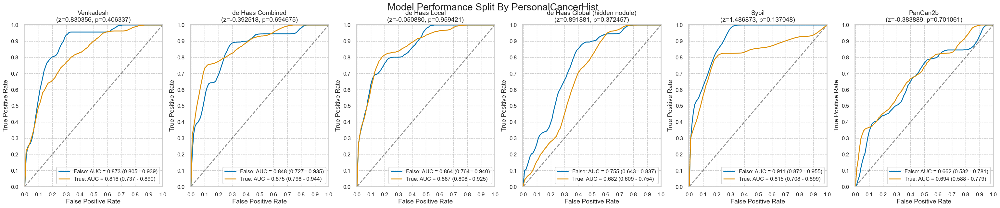

,num,pct,num_mal,pct_mal
False,318,66.388309,20,6.289308
True,161,33.611691,28,17.391304


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.830356,-0.392518,-0.050880,0.891881,1.486873,-0.383889
p,0.406337,0.694675,0.959421,0.372457,0.137048,0.701061


In [46]:
for c in nlst_democols['cat']['other']:
    plot_intersectional(nlst_preds, c)

### Demographics

#### marital: Gender = 1

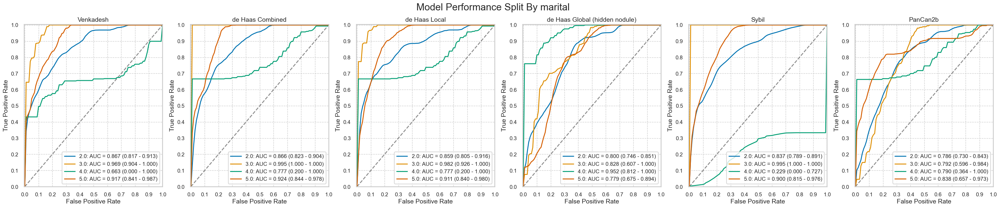

,num,pct,num_mal,pct_mal
1.0,16,2.308802,0,0.000000
2.0,557,80.375180,63,11.310592
3.0,30,4.329004,3,10.000000
4.0,12,1.731602,3,25.000000
5.0,78,11.255411,10,12.820513


More than binary: not computing significance test results.


#### marital: Gender = 2

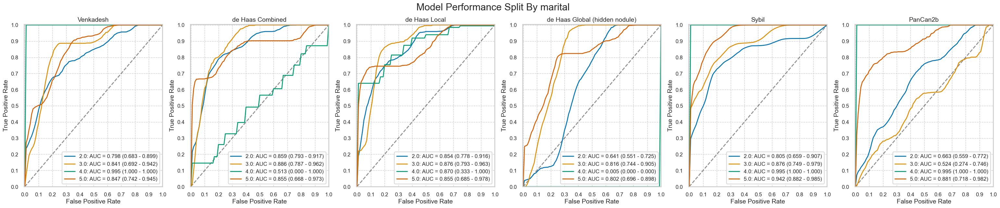

,num,pct,num_mal,pct_mal
1.0,30,6.263048,0,0.000000
2.0,228,47.599165,23,10.087719
3.0,90,18.789144,11,12.222222
4.0,7,1.461378,2,28.571429
5.0,124,25.887265,12,9.677419


More than binary: not computing significance test results.


#### educat: Gender = 1

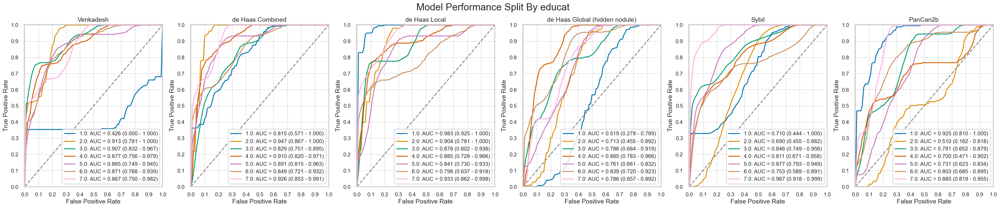

,num,pct,num_mal,pct_mal
1.0,22,3.216374,4,18.181818
2.0,34,4.970760,2,5.882353
3.0,171,25.000000,19,11.111111
4.0,76,11.111111,9,11.842105
5.0,137,20.029240,16,11.678832
6.0,130,19.005848,19,14.615385
7.0,114,16.666667,9,7.894737


More than binary: not computing significance test results.


#### educat: Gender = 2

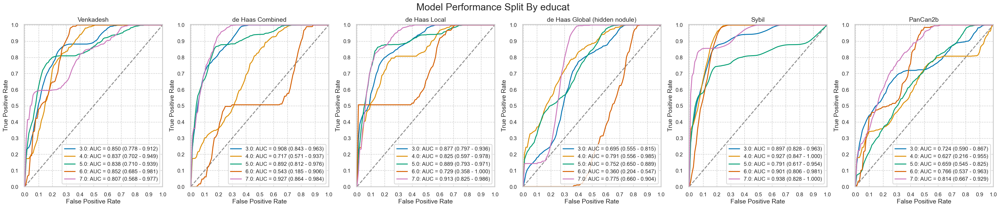

,num,pct,num_mal,pct_mal
1.0,5,1.066098,0,0.000000
2.0,33,7.036247,0,0.000000
3.0,136,28.997868,17,12.500000
4.0,68,14.498934,7,10.294118
5.0,107,22.814499,15,14.018692
6.0,55,11.727079,2,3.636364
7.0,65,13.859275,7,10.769231


More than binary: not computing significance test results.


#### race: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:159: RuntimeWarning: invalid value encountered in scalar divide
  metrics["npv"] = tn / (tn + fn)  ## negative predictive value
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:161: RuntimeWarning: invalid value encountered in scalar divide
  metrics["for"] = fn / (fn + tn)  ## False omission rate
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:159: RuntimeWarning: invalid value encountered in scalar divide
  metrics["npv"] = tn / (tn + fn)  ## negative predictive value
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:161: RuntimeWarning: invalid value encountered in scalar divide
  metrics["for"] = fn / (fn + tn)  ## False omission rate
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:159: RuntimeWarning: invalid value encountered in scalar divide
  metrics["npv"] = tn / (tn + fn)  ## negative predictive value
c:\Users\shaur\Documents\bodyct-lung-malig

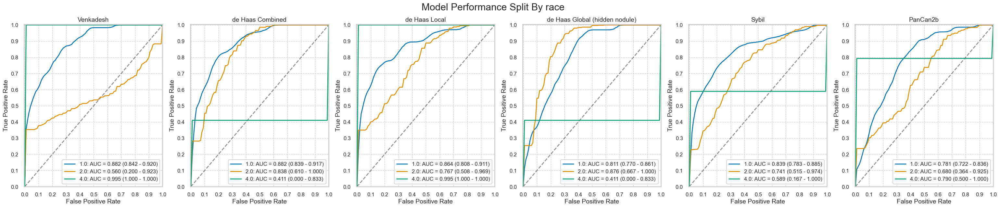

,num,pct,num_mal,pct_mal
1.0,651,94.347826,67,10.291859
2.0,18,2.608696,7,38.888889
3.0,5,0.724638,0,0.000000
4.0,9,1.304348,5,55.555556
5.0,2,0.289855,0,0.000000
6.0,5,0.724638,0,0.000000


More than binary: not computing significance test results.


#### race: Gender = 2

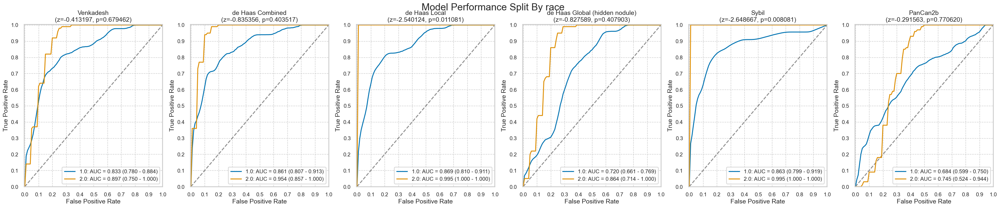

,num,pct,num_mal,pct_mal
1.0,447,93.319415,45,10.067114
2.0,22,4.592902,2,9.090909
3.0,2,0.417537,0,0.000000
4.0,1,0.208768,0,0.000000
5.0,1,0.208768,1,100.000000
6.0,6,1.252610,0,0.000000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.413197,-0.835356,-2.540124,-0.827589,-2.648667,-0.291563
p,0.679462,0.403517,0.011081,0.407903,0.008081,0.770620


#### ethnic: Gender = 1

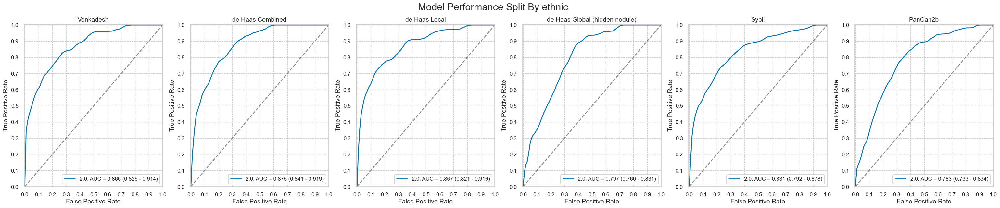

,num,pct,num_mal,pct_mal
1.0,9,1.300578,0,0.000000
2.0,683,98.699422,79,11.566618


More than binary: not computing significance test results.


#### ethnic: Gender = 2

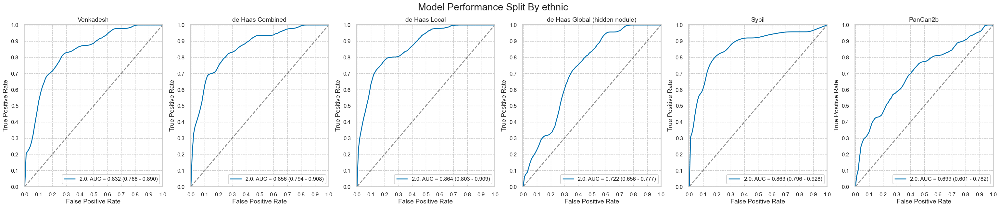

,num,pct,num_mal,pct_mal
1.0,2,0.41841,1,50.00000
2.0,476,99.58159,47,9.87395


More than binary: not computing significance test results.


#### Gender: Gender = 1

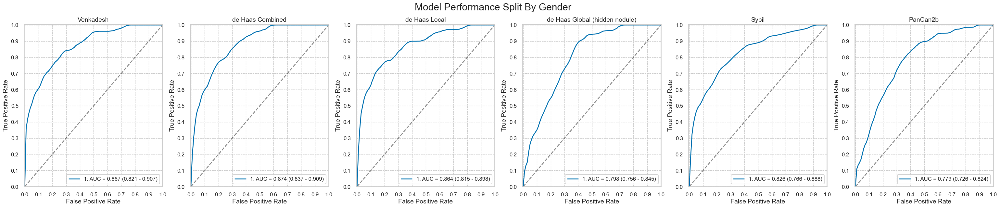

,num,pct,num_mal,pct_mal
1,693,100.0,79,11.399711


More than binary: not computing significance test results.


#### Gender: Gender = 2

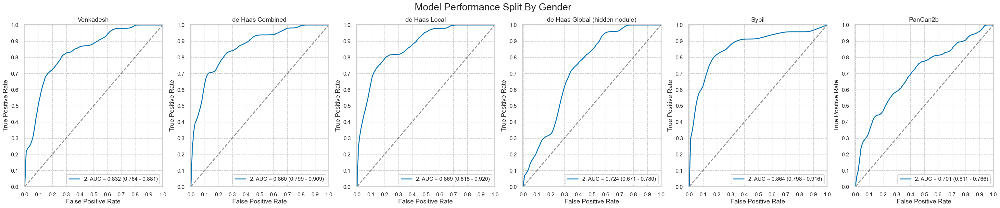

,num,pct,num_mal,pct_mal
2,479,100.0,48,10.020877


More than binary: not computing significance test results.


#### Married: Gender = 1

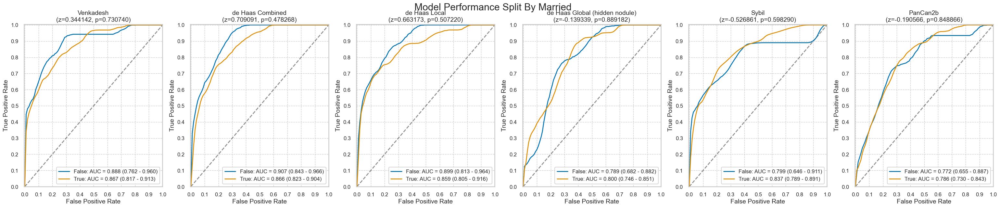

,num,pct,num_mal,pct_mal
False,136,19.62482,16,11.764706
True,557,80.37518,63,11.310592


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.344142,0.709091,0.663173,-0.139339,-0.526861,-0.190566
p,0.730740,0.478268,0.507220,0.889182,0.598290,0.848866


#### Married: Gender = 2

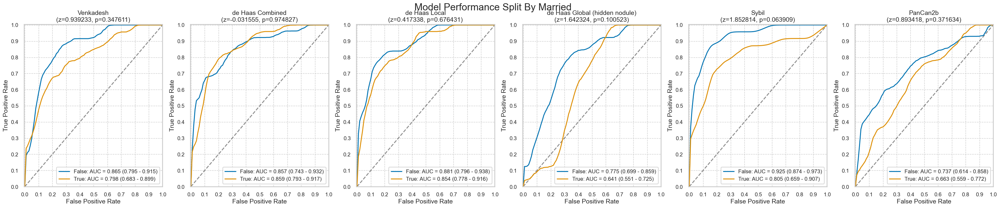

,num,pct,num_mal,pct_mal
False,251,52.400835,25,9.960159
True,228,47.599165,23,10.087719


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.939233,-0.031555,0.417338,1.642324,1.852814,0.893418
p,0.347611,0.974827,0.676431,0.100523,0.063909,0.371634


#### NonHispanicWhite: Gender = 1

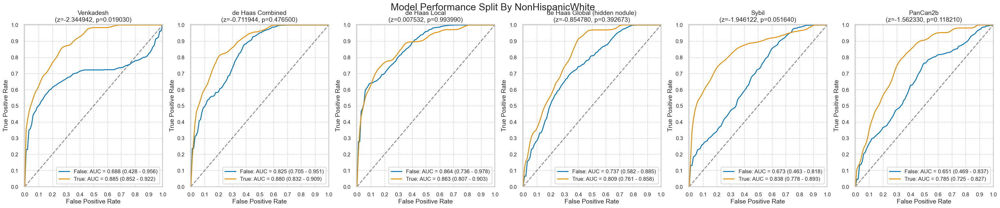

,num,pct,num_mal,pct_mal
False,49,7.070707,12,24.489796
True,644,92.929293,67,10.403727


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-2.344942,-0.711944,0.007532,-0.854780,-1.946122,-1.56233
p,0.019030,0.476500,0.993990,0.392673,0.051640,0.11821


#### NonHispanicWhite: Gender = 2

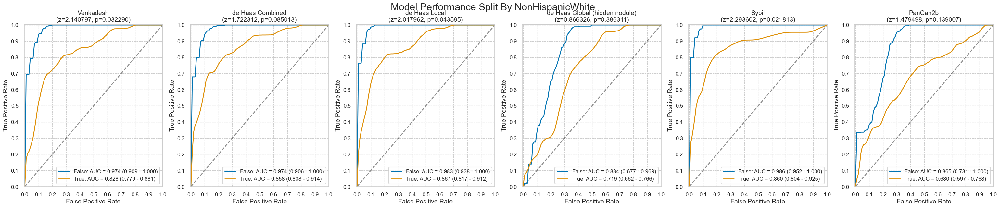

,num,pct,num_mal,pct_mal
False,34,7.098121,4,11.764706
True,445,92.901879,44,9.887640


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,2.140797,1.722312,2.017962,0.866326,2.293602,1.479498
p,0.032290,0.085013,0.043595,0.386311,0.021813,0.139007


#### HighSchoolPlus: Gender = 1

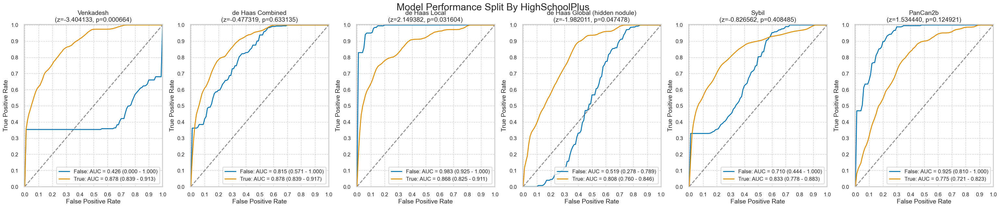

,num,pct,num_mal,pct_mal
False,22,3.174603,4,18.181818
True,671,96.825397,75,11.177347


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-3.404133,-0.477319,2.149382,-1.982011,-0.826562,1.534440
p,0.000664,0.633135,0.031604,0.047478,0.408485,0.124921


#### HighSchoolPlus: Gender = 2

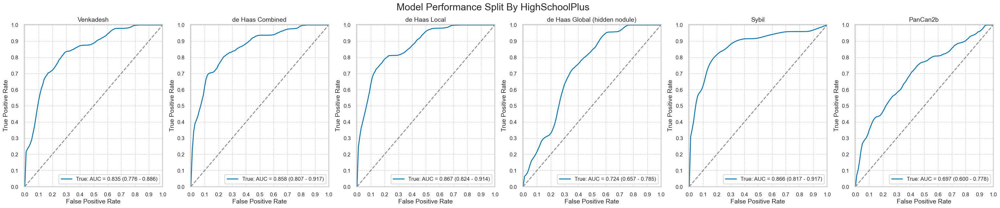

,num,pct,num_mal,pct_mal
False,5,1.043841,0,0.000000
True,474,98.956159,48,10.126582


More than binary: not computing significance test results.


In [47]:
for cat in nlst_democols['cat']['demo']:
    plot_intersectional(nlst_preds, cat)

## Binning for numerical demographic columns

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\3338818666.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_Age')['label'].describe())


,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"(54.999, 63.0]",654.0,0.100917,0.301450,0.0,0.0,0.0,0.0,1.0
"(63.0, 76.0]",518.0,0.117761,0.322636,0.0,0.0,0.0,0.0,1.0


#### bin_Age: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


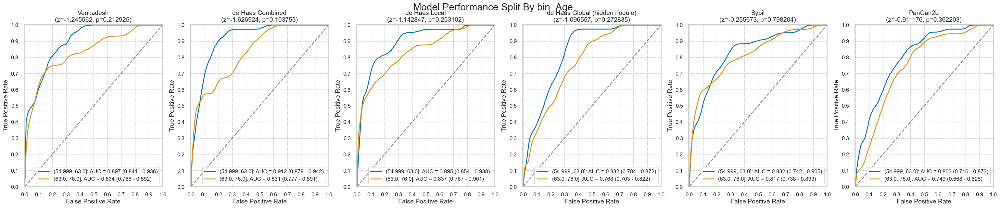

,num,pct,num_mal,pct_mal
"(54.999, 63.0]",364,52.525253,38,10.439560
"(63.0, 76.0]",329,47.474747,41,12.462006


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.245562,-1.626924,-1.142847,-1.096557,-0.255673,-0.911176
p,0.212925,0.103753,0.253102,0.272835,0.798204,0.362203


#### bin_Age: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


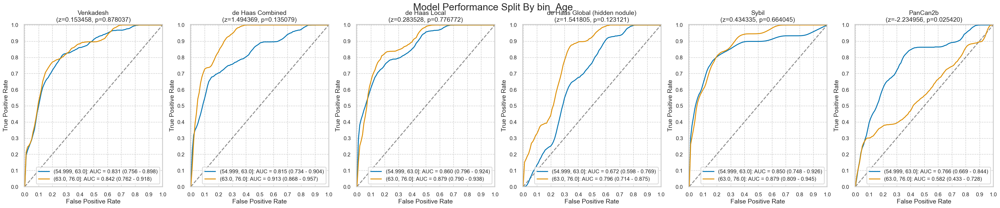

,num,pct,num_mal,pct_mal
"(54.999, 63.0]",290,60.542797,28,9.655172
"(63.0, 76.0]",189,39.457203,20,10.582011


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.153458,1.494369,0.283528,1.541805,0.434335,-2.234956
p,0.878037,0.135079,0.776772,0.123121,0.664045,0.025420


In [48]:
# nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
nlst_preds['bin_Age'] = pd.qcut(nlst_preds['Age'], q=2)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_intersectional(nlst_preds, f'bin_Age')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\1366853022.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())


label                                              height  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_height                                                              
(48, 68]    590.0  0.096610  0.295677  0.0  0.0  0.0  0.0  1.0  590.0   
(68, 88]    582.0  0.120275  0.325563  0.0  0.0  0.0  0.0  1.0  582.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.957627  2.309624  59.0  63.0  65.0  67.0  68.0  
(68, 88]    71.348797  1.939797  69.0  70.0  71.0  72.0  78.0

#### bin_height: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


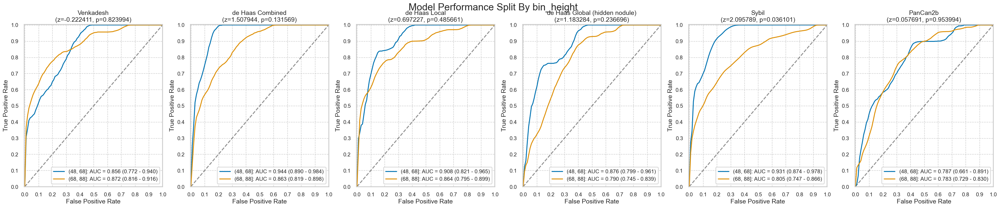

,num,pct,num_mal,pct_mal
"(48, 68]",150,21.645022,12,8.000000
"(68, 88]",543,78.354978,67,12.338858


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.222411,1.507944,0.697227,1.183284,2.095789,0.057691
p,0.823994,0.131569,0.485661,0.236696,0.036101,0.953994


#### bin_height: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


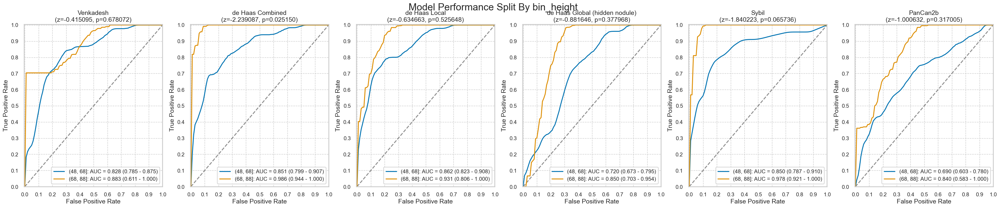

,num,pct,num_mal,pct_mal
"(48, 68]",440,91.858038,45,10.227273
"(68, 88]",39,8.141962,3,7.692308


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.415095,-2.239087,-0.634663,-0.881646,-1.840223,-1.000632
p,0.678072,0.025150,0.525648,0.377968,0.065736,0.317005


In [49]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_intersectional(nlst_preds, f'bin_height')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\936658290.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())


label                                              weight  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_weight                                                              
(79, 179]   565.0  0.107965  0.310611  0.0  0.0  0.0  0.0  1.0  565.0   
(179, 279]  588.0  0.108844  0.311708  0.0  0.0  0.0  0.0  1.0  588.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   150.851327  20.469988   90.0  139.0  155.0  168.0  178.0  
(179, 279]  210.079932  24.316386  180.0  190.0  204.0  225.0  275.0

#### bin_weight: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


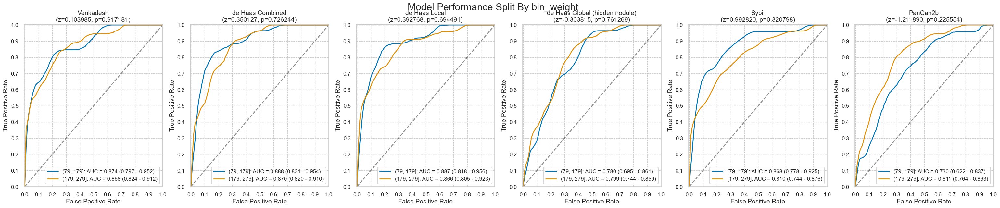

,num,pct,num_mal,pct_mal
"(79, 179]",218,32.296296,25,11.467890
"(179, 279]",457,67.703704,53,11.597374


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.103985,0.350127,0.392768,-0.303815,0.992820,-1.211890
p,0.917181,0.726244,0.694491,0.761269,0.320798,0.225554


#### bin_weight: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


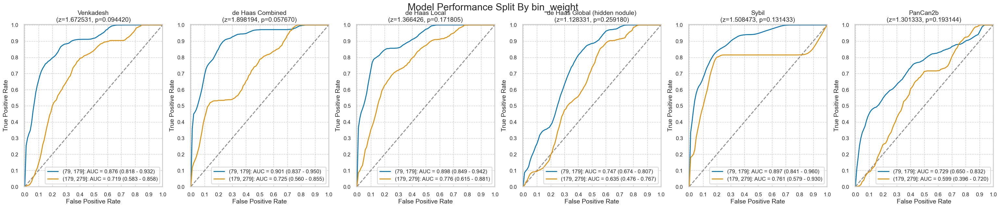

,num,pct,num_mal,pct_mal
"(79, 179]",347,72.594142,36,10.374640
"(179, 279]",131,27.405858,11,8.396947


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.672531,1.898194,1.366426,1.128331,1.508473,1.301333
p,0.094420,0.057670,0.171805,0.259180,0.131433,0.193144


In [50]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_intersectional(nlst_preds, f'bin_weight')